
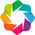

In [1]:
import holoviews as hv
hv.notebook_extension('bokeh')

In [2]:
from lsst.daf.persistence import Butler

repo_path = '/datasets/hsc/repo/rerun/RC/w_2018_04/DM-13256/'
butler = Butler(repo_path)

In [3]:
from explorer.catalog import CoaddCatalog, VisitCatalog, MultiMatchedCatalog
from explorer.utils import get_visits

tract = 9615
filt = 'HSC-I'
dataId = {'tract':tract, 'filter':filt}
catalog = CoaddCatalog(butler, dataId)
# visit_catalogs = [VisitCatalog(butler, {'tract': tract, 'filter':filt, 'visit':v}, name=v) for v in get_visits(butler, tract, filt)]
# matched_catalog = MultiMatchedCatalog(catalog, visit_catalogs, match_registry='t9615_demo.h5')

In [4]:
from explorer.functors import MagDiff, Seeing, DeconvolvedMoments, Column

magdiff = MagDiff('modelfit_CModel', 'base_PsfFlux')
magdiff_gauss = MagDiff('base_GaussianFlux', 'base_PsfFlux')

funcs = {'cmodel':magdiff, 'gauss':magdiff_gauss, 'count': Column('base_InputCount_value'), 'seeing':Seeing()}
matched_funcs = {'guass':magdiff_gauss, 'seeing':Seeing()}

In [5]:
from explorer.dataset import QADataset

flags = ['calib_psfUsed', 'qaBad_flag',
 'merge_measurement_i',
 'merge_measurement_r',
 'merge_measurement_z',
 'merge_measurement_y',
 'merge_measurement_g',
 'base_Footprint_nPix_flag',
 'base_PixelFlags_flag_inexact_psfCenter']

data = QADataset(catalog, funcs, flags=flags)
# matched_data = QADataset(matched_catalog, matched_funcs, flags=flags) #memory issues for demo

In [6]:
# Calculate dataframe; see how long it takes.
%time data.df.head()

/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/dask/local.py:271: RuntimeWarning: divide by zero encountered in log10
  return func(*args2)
/ssd/lsstsw/stack3_20171021/python/miniconda3-4.3.21/lib/python3.6/site-packages/dask/local.py:271: RuntimeWarning: invalid value encountered in log10
  return func(*args2)


CPU times: user 9.49 s, sys: 1.66 s, total: 11.1 s
Wall time: 19.3 s


,base_Footprint_nPix_flag,base_PixelFlags_flag_inexact_psfCenter,calib_psfUsed,cmodel,count,dec,gauss,label,merge_measurement_g,merge_measurement_i,merge_measurement_r,merge_measurement_y,merge_measurement_z,patchId,qaBad_flag,ra,seeing,x
id,,,,,,,,,,,,,,,,,,
42287217204264961,False,False,False,-0.160032,7,-0.095521,-0.169774,null,False,True,False,False,False,"0,0",True,217.132928,0.807439,25.519317
42287217204264968,False,False,False,-0.712531,7,-0.095429,-0.631927,null,False,True,False,False,False,"0,0",True,217.092807,0.808911,22.879350
42287217204264972,False,False,False,-0.000603,8,-0.094888,0.006244,star,False,True,False,False,False,"0,0",True,217.058166,0.773655,22.771899
42287217204264990,False,False,False,-0.316413,8,-0.095571,-0.345569,null,False,True,False,False,False,"0,0",True,216.998380,0.766290,24.457679
42287217204264993,False,False,False,-0.429495,7,-0.095523,-0.314505,null,False,True,False,False,False,"0,0",True,217.068641,0.755195,25.700984


In [7]:
from explorer.plots import FilterStream, multi_scattersky
filter_stream = FilterStream()
multi_scattersky(data.ds, filter_stream=filter_stream, width=900, height=300)

:Layout
   .DynamicMap.I    :DynamicMap   []
   .DynamicMap.II   :DynamicMap   []
   .DynamicMap.III  :DynamicMap   []
   .DynamicMap.IV   :DynamicMap   []
   .DynamicMap.V    :DynamicMap   []
   .DynamicMap.VI   :DynamicMap   []
   .DynamicMap.VII  :DynamicMap   []
   .DynamicMap.VIII :DynamicMap   []
   .DynamicMap.IX   :DynamicMap   []
   .DynamicMap.X    :DynamicMap   []
   .DynamicMap.XI   :DynamicMap   []
   .DynamicMap.XII  :DynamicMap   []

You can use the flags you defined the dataset with to select points in the above plots, as long as you pass the same `FilterStream` object. 

In [8]:
from explorer.plots import FlagSetter
import parambokeh

flag_setter = FlagSetter(filter_stream=filter_stream, flags=data.flags, bad_flags=data.flags)
parambokeh.Widgets(flag_setter, callback=flag_setter.event, push=False, on_init=True)

Note that the above plots are "datashaded," meaning that they do not contain information about individual points.  If you want to see a plot containing individual point information, you may use the `.coadd_explore` method of `QADataset`, as follows (note that the same `FilterStream` is being used, so the above `FlagSetter` can still be used).

In [9]:
%%output max_frames=10000
%%opts Points [width=500, height=500, tools=['hover'], colorbar=True] (cmap='coolwarm', size=4)

coadd_dmap = data.coadd_explore('seeing', filter_stream=filter_stream)
tap = hv.streams.Tap(source=coadd_dmap, rename={'x':'ra', 'y':'dec'})

coadd_dmap

:DynamicMap   [x_max,label]

Note how we defined a tap stream.  Below, we connect this to a ginga display window such that when you click on the above sky plot, it shows the image below, with a crosshair centered on the closest object currently displayed in the plot.

In [10]:
import lsst.afw.display
lsst.afw.display.setDefaultBackend("ginga")

from explorer.display import CoaddDisplay
coadd_display = CoaddDisplay(butler, filt, dims=(500,500))
coadd_display.connect_tap(tap)
coadd_display.embed()

Image(value=b'', format='jpeg', height='500', width='500')

In [11]:
%%opts RGB [width=400, height=400]

from explorer.plots import skyplot, skyplot_layout
skyplots = [skyplot(data.ds.groupby('label'), vdim=d, filter_stream=filter_stream).relabel(d) for d in funcs]
skyplot_layout(skyplots).cols(3)

:Layout
   .DynamicMap.Cmodel :DynamicMap   [label]
   .DynamicMap.Gauss  :DynamicMap   [label]
   .DynamicMap.Count  :DynamicMap   [label]
   .DynamicMap.Seeing :DynamicMap   [label]